In [1]:
## historical volatility < implied volatility

## large firms use put options as a form of insurance, so they are willing to pay more to mitigate downside risk

## learn how to compute historical volatility and ways to compare it to implied volatiltiy

## when historical volatility < implied volatilty 
## options might be overpriced(most common)

## when historical volatilty > implied volatility
## options might be underpriced(less common)

## the stock market places value where it see fit. usually foreseeing basic 
## supply / demand shifts, trust these shifts and invest in them

In [2]:
from update_prices import load_symbol

In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as pylo
import plotly.graph_objects as go
import pandas as pd
import numpy as np

In [4]:
pylo.init_notebook_mode(connected=True)

In [5]:
import duckdb

con = duckdb.connect(r"C:\Users\ryan0\data\market_data.duckdb", read_only=True)

print(con.execute("SHOW TABLES").fetchall())
print(con.execute("SELECT COUNT(*) FROM stock_data").fetchall())

[('stock_data',)]
[(70971,)]


In [6]:
from pathlib import Path
from config import DB_PATH
print(Path(DB_PATH).resolve())

C:\Users\ryan0\data\market_data.duckdb


In [7]:
### use duckdb(get more familiar with sql), figure out how to 'dump' all api queries into a folder differeniated by UUID's

In [8]:
df = con.sql("SELECT symbol, week_date, adjusted_close FROM stock_data ORDER By symbol, week_date").df()

In [9]:
df["return"] = df.groupby("symbol")["adjusted_close"].pct_change()

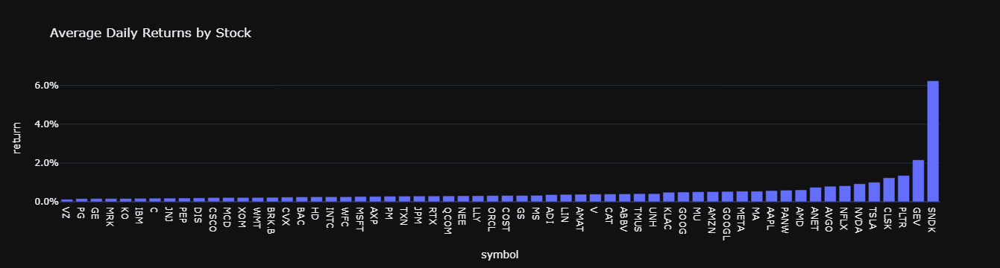

In [10]:
mean_returns = (
    df.groupby("symbol", as_index=False)["return"]
      .mean()
      .sort_values("return")
)

fig = px.bar(
    mean_returns,
    x="symbol",
    y="return",
    title="Average Daily Returns by Stock",
    template="plotly_dark"
)

fig.update_yaxes(tickformat=".1%")
fig.show()

In [11]:
lg = con.sql("""SELECT symbol, week_date, adjusted_close, LN(adjusted_close / LAG(adjusted_close) OVER (
        PARTITION BY symbol ORDER BY week_date)) AS log_return
FROM stock_data""").df()

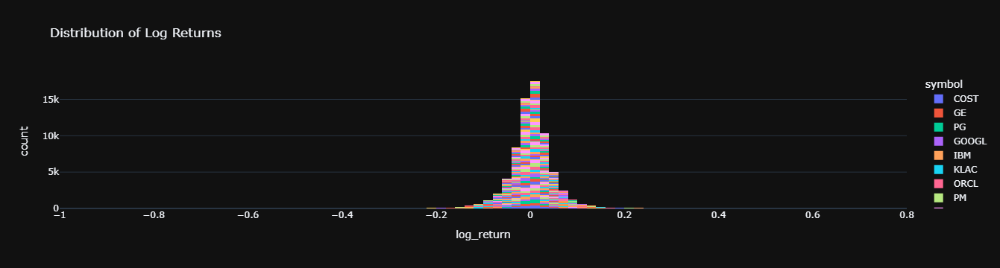

In [12]:
fig = px.histogram(
    lg,
    x="log_return",
    color="symbol",
    nbins=100,
    title="Distribution of Log Returns",
    template="plotly_dark")
fig.show()

In [13]:
lg["cum_log_return"] = (lg.groupby("symbol")["log_return"].cumsum())

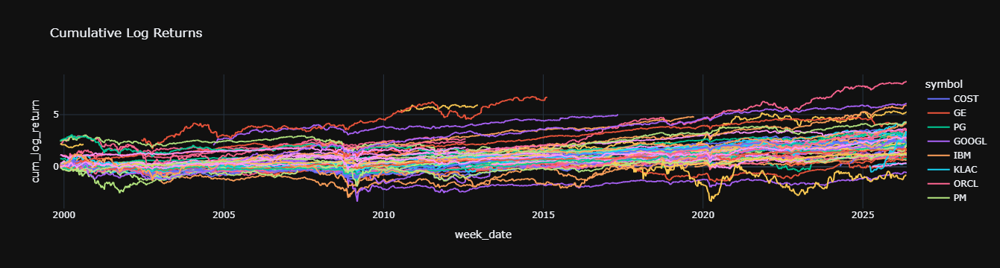

In [14]:
fig = px.line(
    lg,
    x="week_date",
    y="cum_log_return",
    color="symbol",
    title="Cumulative Log Returns",
    template="plotly_dark"
)

fig.show()

In [15]:
sma = con.sql("""
    SELECT
        symbol,
        week_date,
        adjusted_close,
        sma_20,
        sma_50,
        CASE
            WHEN sma_20 > sma_50 THEN 1
            WHEN sma_20 < sma_50 THEN -1
            ELSE 0
        END AS position
    FROM(
        SELECT
            symbol,
            week_date, 
            adjusted_close,
            AVG(adjusted_close) OVER(
            PARTITION BY symbol
            ORDER BY week_date
            ROWS BETWEEN 19 PRECEDING AND CURRENT ROW
            ) AS sma_20,
            AVG(adjusted_close) OVER(
            PARTITION BY symbol
            ORDER BY week_date
            ROWS BETWEEN 49 PRECEDING AND CURRENT ROW
            ) AS sma_50
        FROM stock_data
        )
    ORDER BY symbol, week_date
        """).df()

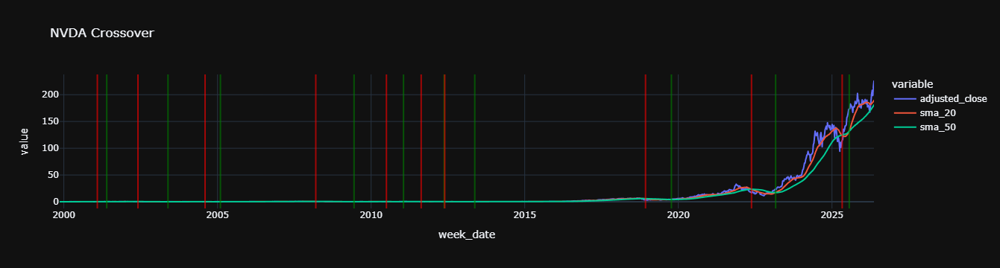

In [16]:
df_one = sma[sma["symbol"] == "NVDA"]

df_one["signal"] = df_one["position"].diff()

fig = px.line(
    df_one,
    x="week_date",
    y=["adjusted_close", "sma_20", "sma_50"],
    title="NVDA Crossover",
    template="plotly_dark"
)

buy = df_one[df_one["signal"] == 2]
sell = df_one[df_one["signal"] == -2]

for d in buy["week_date"]:
    fig.add_vline(
        x=d,
        line_color="green",
        line_width=2,
        opacity=0.6
    )

for d in sell["week_date"]:
    fig.add_vline(
        x=d,
        line_color="red",
        line_width=2,
        opacity=0.6
    )

fig.update_layout(hovermode="x unified")

fig.show()

In [17]:
## SMA convergence alone isn’t a strong signal.
## SMA becomes useful when combined with:slope, volatility, price structure

In [18]:
symbol = "NVDA"

bb = con.execute("""
    WITH base AS (
        SELECT
            symbol,
            week_date,
            open,
            high,
            low,
            adjusted_close,
            AVG(adjusted_close) OVER (
                PARTITION BY symbol
                ORDER BY week_date
                ROWS BETWEEN 19 PRECEDING AND CURRENT ROW
            ) AS middle_band,
            STDDEV_SAMP(adjusted_close) OVER (
                PARTITION BY symbol
                ORDER BY week_date
                ROWS BETWEEN 19 PRECEDING AND CURRENT ROW
            ) AS rolling_std
        FROM stock_data
        WHERE symbol = ?
    ),
    bands AS (
        SELECT
            *,
            middle_band + (2 * rolling_std) AS upper_band,
            middle_band - (2 * rolling_std) AS lower_band
        FROM base
    )
    SELECT
        *
    FROM bands
    WHERE rolling_std IS NOT NULL
    ORDER BY week_date DESC
    LIMIT 100
""", [symbol]).df()

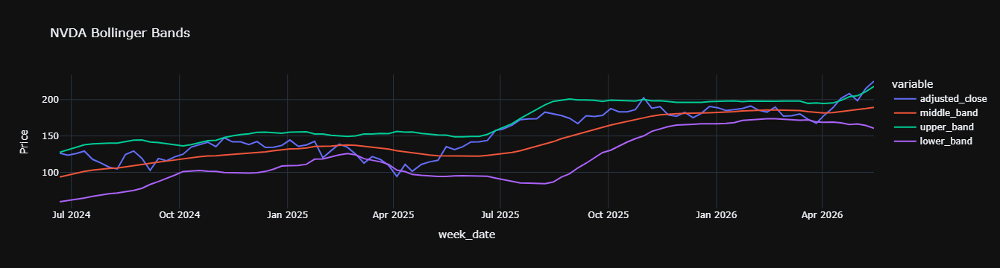

In [19]:
bb = bb.sort_values("week_date")

fig = px.line(
    bb,
    x="week_date",
    y=["adjusted_close", "middle_band", "upper_band", "lower_band"],
    title="NVDA Bollinger Bands",
    template="plotly_dark"
)

fig.update_layout(
    hovermode="x unified",
    yaxis_title="Price"
)

fig.show()

In [20]:
def backtest_zscore_mean_reversion(con, window=20, threshold=2.0, holding_weeks=1):
    return con.execute(f"""
        WITH base AS (
            SELECT
                symbol,
                week_date,
                adjusted_close,

                AVG(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_mean,

                STDDEV_SAMP(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_std,

                COUNT(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_count

            FROM stock_data
        ),

        zscores AS (
            SELECT
                *,
                (adjusted_close - rolling_mean) / rolling_std AS z_score
            FROM base
            WHERE rolling_count = {window}
              AND rolling_std IS NOT NULL
              AND rolling_std != 0
        ),

        signals AS (
            SELECT
                *,
                CASE
                    WHEN z_score >= {threshold} THEN -1
                    WHEN z_score <= -{threshold} THEN 1
                    ELSE 0
                END AS signal,

                CASE
                    WHEN z_score >= {threshold} THEN 'sell'
                    WHEN z_score <= -{threshold} THEN 'buy'
                    ELSE 'hold'
                END AS signal_label
            FROM zscores
        ),

        forward_returns AS (
            SELECT
                *,
                LEAD(adjusted_close, {holding_weeks}) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                ) AS future_close
            FROM signals
        )

        SELECT
            symbol,
            week_date,
            adjusted_close,
            future_close,
            rolling_mean,
            rolling_std,
            z_score,
            signal,
            signal_label,

            future_close / adjusted_close - 1 AS forward_return,

            signal * (future_close / adjusted_close - 1) AS strategy_return

            

        FROM forward_returns
        WHERE signal != 0
          AND future_close IS NOT NULL

        ORDER BY week_date DESC, ABS(z_score) DESC
    """).df()

In [21]:
results = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    bt = backtest_zscore_mean_reversion(
        con,
        window=20,
        threshold=threshold,
        holding_weeks=4,
    )

    summary = (
        bt.groupby(["signal_label"])
          .agg(
              trades=("strategy_return", "count"),
              avg_return=("strategy_return", "mean"),
              median_return=("strategy_return", "median"),
              win_rate=("strategy_return", lambda x: (x > 0).mean()),
              total_return=("strategy_return", "sum"),
              best_trade=("strategy_return", "max"),
              worst_trade=("strategy_return", "min"),
          )
          .reset_index()
    )

    summary["threshold"] = threshold
    results.append(summary)

threshold_results = pd.concat(results, ignore_index=True)

threshold_results

,signal_label,trades,avg_return,median_return,win_rate,total_return,best_trade,worst_trade,threshold
0,buy,6256,0.022852,0.019205,0.591592,142.962133,0.897818,-0.685666,1.5
1,sell,14517,-0.011199,-0.008772,0.432941,-162.572240,0.594102,-1.708134,1.5
2,buy,2251,0.031478,0.027136,0.619725,70.857549,0.862064,-0.685666,2.0
3,sell,5010,-0.013415,-0.008384,0.433932,-67.210766,0.533898,-1.708134,2.0
4,buy,601,0.039200,0.031653,0.620632,23.559037,0.862064,-0.685666,2.5
5,sell,1057,-0.023004,-0.009516,0.435194,-24.315018,0.533898,-1.708134,2.5
6,buy,155,0.082984,0.061901,0.683871,12.862456,0.675407,-0.334601,3.0
7,sell,174,-0.032018,-0.016428,0.402299,-5.571091,0.533898,-1.002565,3.0


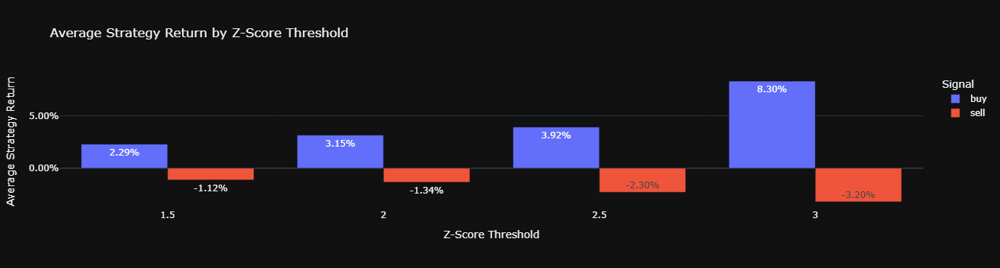

In [22]:
fig = px.bar(
    threshold_results,
    x="threshold",
    y="avg_return",
    color="signal_label",
    barmode="group",
    text_auto=".2%",
    title="Average Strategy Return by Z-Score Threshold",
    labels={
        "threshold": "Z-Score Threshold",
        "avg_return": "Average Strategy Return",
        "signal_label": "Signal"
    },
    template="plotly_dark"
)

fig.update_layout(
    yaxis_tickformat=".2%",
    hovermode="x unified"
)

fig.show()

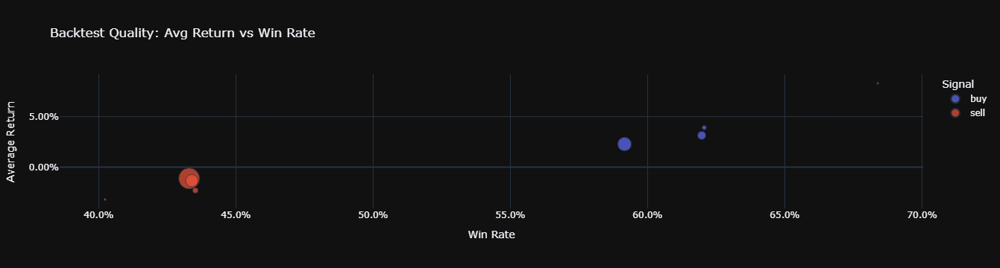

In [23]:
fig = px.scatter(
    threshold_results,
    x="win_rate",
    y="avg_return",
    color="signal_label",
    size="trades",
    hover_data=["threshold", "trades", "total_return", "best_trade", "worst_trade"],
    title="Backtest Quality: Avg Return vs Win Rate",
    labels={
        "win_rate": "Win Rate",
        "avg_return": "Average Return",
        "signal_label": "Signal",
        "trades": "Number of Trades"
    },
    template="plotly_dark"
)

fig.update_layout(
    xaxis_tickformat=".1%",
    yaxis_tickformat=".2%"
)

fig.show()

In [24]:
bt.sort_values(
    ["week_date"],
    ascending=[False]
).head(25)

,symbol,week_date,adjusted_close,future_close,rolling_mean,rolling_std,z_score,signal,signal_label,forward_return,strategy_return
0,ANET,2026-04-24,176.9100,141.7100,136.555500,13.409927,3.009301,-1,sell,-0.198971,0.198971
1,ANET,2026-04-17,164.2300,141.9700,134.139500,9.555707,3.148956,-1,sell,-0.135542,0.135542
2,INTC,2026-04-10,62.3800,124.9200,44.614000,5.794975,3.065760,-1,sell,1.002565,-1.002565
3,AXP,2026-02-27,307.9255,291.3480,358.323850,16.772128,-3.004887,1,buy,-0.053836,-0.053836
4,PEP,2026-02-06,168.9823,159.4300,145.612435,6.795007,3.439270,-1,sell,-0.056528,0.056528
5,MSFT,2025-11-21,471.0442,484.8128,507.864665,11.686246,-3.150752,1,buy,0.029230,0.029230
6,CSCO,2025-11-14,77.1715,76.9736,68.164380,2.860888,3.148365,-1,sell,-0.002564,0.002564
7,LIN,2025-10-31,415.3919,407.4674,461.675515,15.027574,-3.079913,1,buy,-0.019077,-0.019077
8,INTC,2025-09-26,35.5000,38.2800,23.078500,3.852379,3.224371,-1,sell,0.078310,-0.078310
9,SNDK,2025-09-19,102.2100,140.1600,49.582000,16.893961,3.115196,-1,sell,0.371294,-0.371294


In [25]:
recent_buys = (
    bt[bt["signal_label"] == "buy"]
      .sort_values("week_date", ascending=False)
      .head(25)
)

recent_buys

,symbol,week_date,adjusted_close,future_close,rolling_mean,rolling_std,z_score,signal,signal_label,forward_return,strategy_return
3,AXP,2026-02-27,307.9255,291.3480,358.323850,16.772128,-3.004887,1,buy,-0.053836,-0.053836
5,MSFT,2025-11-21,471.0442,484.8128,507.864665,11.686246,-3.150752,1,buy,0.029230,0.029230
7,LIN,2025-10-31,415.3919,407.4674,461.675515,15.027574,-3.079913,1,buy,-0.019077,-0.019077
12,ADI,2025-04-04,162.1041,195.5787,209.249085,13.867430,-3.399692,1,buy,0.206501,0.206501
13,MU,2025-04-04,64.5631,80.5243,94.525925,8.853267,-3.384381,1,buy,0.247219,0.247219
14,QCOM,2025-04-04,124.5448,136.6123,154.907425,9.315960,-3.259205,1,buy,0.096893,0.096893
15,BAC,2025-04-04,33.6319,40.1646,43.301615,2.969212,-3.256660,1,buy,0.194241,0.194241
16,TXN,2025-04-04,145.9919,159.9922,179.638670,10.515182,-3.199828,1,buy,0.095898,0.095898
17,DIS,2025-04-04,82.6187,91.4809,107.102270,7.910723,-3.094985,1,buy,0.107266,0.107266
25,MRK,2024-08-02,108.6259,111.6904,119.534790,3.458947,-3.153819,1,buy,0.028212,0.028212


In [26]:
all_trades = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    bt = backtest_zscore_mean_reversion(
        con,
        window=20,
        threshold=threshold,
        holding_weeks=4
    )

    bt["threshold"] = threshold
    all_trades.append(bt)

trades_all_thresholds = pd.concat(all_trades, ignore_index=True)

In [27]:
recent_all = (
    trades_all_thresholds
    .sort_values("week_date", ascending=False)
    .head(50)
)
recent_all

,symbol,week_date,adjusted_close,future_close,rolling_mean,rolling_std,z_score,signal,signal_label,forward_return,strategy_return,threshold
0,ANET,2026-04-24,176.9100,141.71,136.555500,13.409927,3.009301,-1,sell,-0.198971,0.198971,1.5
20777,RTX,2026-04-24,174.2600,175.91,194.544145,9.657069,-2.100445,1,buy,0.009469,0.009469,2.0
29692,ANET,2026-04-24,176.9100,141.71,136.555500,13.409927,3.009301,-1,sell,-0.198971,0.198971,3.0
28036,KLAC,2026-04-24,1935.0000,1756.45,1474.881825,183.386033,2.509014,-1,sell,-0.092274,0.092274,2.5
28035,TXN,2026-04-24,275.7465,300.60,201.480740,24.779486,2.997066,-1,sell,0.090132,-0.090132,2.5
28034,ANET,2026-04-24,176.9100,141.71,136.555500,13.409927,3.009301,-1,sell,-0.198971,0.198971,2.5
20773,ANET,2026-04-24,176.9100,141.71,136.555500,13.409927,3.009301,-1,sell,-0.198971,0.198971,2.0
20774,TXN,2026-04-24,275.7465,300.60,201.480740,24.779486,2.997066,-1,sell,0.090132,-0.090132,2.0
20775,KLAC,2026-04-24,1935.0000,1756.45,1474.881825,183.386033,2.509014,-1,sell,-0.092274,0.092274,2.0
20776,ADI,2026-04-24,399.5700,418.58,317.834195,34.106634,2.396478,-1,sell,0.047576,-0.047576,2.0


In [28]:
def backtest_high_low_zscore_mean_reversion(
    con,
    window=20,
    threshold=2.0,
    holding_weeks=1
):
    return con.execute(f"""
        WITH adjusted_prices AS (
            SELECT
                symbol,
                week_date,
                close,
                adjusted_close,

                -- Adjust raw high/low onto the same scale as adjusted_close
                high * (adjusted_close / close) AS adjusted_high,
                low * (adjusted_close / close) AS adjusted_low

            FROM stock_data
            WHERE close IS NOT NULL
              AND close != 0
              AND adjusted_close IS NOT NULL
        ),

        base AS (
            SELECT
                symbol,
                week_date,
                adjusted_high,
                adjusted_low,
                adjusted_close,

                AVG(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_mean,

                STDDEV_SAMP(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_std,

                COUNT(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_count

            FROM adjusted_prices
        ),

        zscores AS (
            SELECT
                *,
                (adjusted_close - rolling_mean) / rolling_std AS close_z_score,
                (adjusted_high - rolling_mean) / rolling_std AS high_z_score,
                (adjusted_low - rolling_mean) / rolling_std AS low_z_score

            FROM base
            WHERE rolling_count = {window}
              AND rolling_std IS NOT NULL
              AND rolling_std != 0
        ),

        signals AS (
            SELECT
                *,
                CASE
                    WHEN low_z_score <= -{threshold} THEN 1
                    WHEN high_z_score >= {threshold} THEN -1
                    ELSE 0
                END AS signal,

                CASE
                    WHEN low_z_score <= -{threshold} THEN 'buy'
                    WHEN high_z_score >= {threshold} THEN 'sell'
                    ELSE 'hold'
                END AS signal_label,

                CASE
                    WHEN low_z_score <= -{threshold} THEN low_z_score
                    WHEN high_z_score >= {threshold} THEN high_z_score
                    ELSE close_z_score
                END AS trigger_z_score,

                CASE
                    WHEN low_z_score <= -{threshold} THEN 'weekly_adjusted_low'
                    WHEN high_z_score >= {threshold} THEN 'weekly_adjusted_high'
                    ELSE 'none'
                END AS trigger_source

            FROM zscores
        ),

        forward_returns AS (
            SELECT
                *,
                LEAD(adjusted_close, {holding_weeks}) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                ) AS future_close
            FROM signals
        )

        SELECT
            symbol,
            week_date,

            adjusted_high,
            adjusted_low,
            adjusted_close,
            future_close,

            rolling_mean,
            rolling_std,

            close_z_score,
            high_z_score,
            low_z_score,
            trigger_z_score,
            trigger_source,

            signal,
            signal_label,

            future_close / adjusted_close - 1 AS forward_return,

            signal * (future_close / adjusted_close - 1) AS strategy_return

        FROM forward_returns
        WHERE signal != 0
          AND future_close IS NOT NULL

        ORDER BY week_date DESC, ABS(trigger_z_score) DESC
    """).df()

In [29]:
results = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    btwo = backtest_high_low_zscore_mean_reversion(
        con,
        window=20,
        threshold=threshold,
        holding_weeks=4,
    )

    summary = (
        btwo.groupby(["signal_label"])
          .agg(
              trades=("strategy_return", "count"),
              avg_return=("strategy_return", "mean"),
              median_return=("strategy_return", "median"),
              win_rate=("strategy_return", lambda x: (x > 0).mean()),
              total_return=("strategy_return", "sum"),
              best_trade=("strategy_return", "max"),
              worst_trade=("strategy_return", "min"),
          )
          .reset_index()
    )

    summary["threshold"] = threshold
    results.append(summary)

threshold_results = pd.concat(results, ignore_index=True)

threshold_results

,signal_label,trades,avg_return,median_return,win_rate,total_return,best_trade,worst_trade,threshold
0,buy,11837,0.018385,0.017368,0.587733,217.626980,0.897818,-0.685666,1.5
1,sell,24124,-0.011595,-0.009801,0.428950,-279.712326,0.626296,-1.959184,1.5
2,buy,5617,0.020102,0.018365,0.591953,112.915562,0.897818,-0.685666,2.0
3,sell,10641,-0.011938,-0.009225,0.430881,-127.032039,0.623170,-1.959184,2.0
4,buy,2096,0.020193,0.015973,0.576813,42.324290,0.862064,-0.685666,2.5
5,sell,3047,-0.017365,-0.010277,0.423039,-52.912274,0.533898,-1.959184,2.5
6,buy,736,0.030535,0.024909,0.595109,22.473455,0.862064,-0.491279,3.0
7,sell,743,-0.022983,-0.010251,0.426649,-17.076582,0.533898,-1.588732,3.0


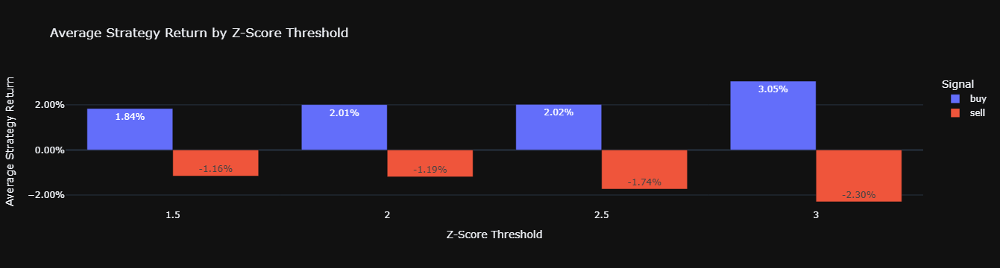

In [30]:
fig = px.bar(
    threshold_results,
    x="threshold",
    y="avg_return",
    color="signal_label",
    barmode="group",
    text_auto=".2%",
    title="Average Strategy Return by Z-Score Threshold",
    labels={
        "threshold": "Z-Score Threshold",
        "avg_return": "Average Strategy Return",
        "signal_label": "Signal"
    },
    template="plotly_dark"
)

fig.update_layout(
    yaxis_tickformat=".2%",
    hovermode="x unified"
)

fig.show()

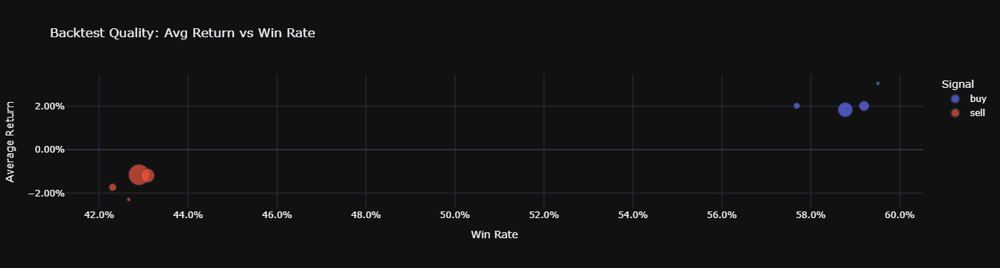

In [31]:
fig = px.scatter(
    threshold_results,
    x="win_rate",
    y="avg_return",
    color="signal_label",
    size="trades",
    hover_data=["threshold", "trades", "total_return", "best_trade", "worst_trade"],
    title="Backtest Quality: Avg Return vs Win Rate",
    labels={
        "win_rate": "Win Rate",
        "avg_return": "Average Return",
        "signal_label": "Signal",
        "trades": "Number of Trades"
    },
    template="plotly_dark"
)

fig.update_layout(
    xaxis_tickformat=".1%",
    yaxis_tickformat=".2%"
)

fig.show()

In [32]:
all_trades = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    btwo = backtest_high_low_zscore_mean_reversion(
        con,
        window=20,
        threshold=threshold,
        holding_weeks=4
    )

    btwo["threshold"] = threshold
    all_trades.append(btwo)

trades_all_thresholds = pd.concat(all_trades, ignore_index=True)

In [39]:
recent_3all = (
    trades_all_thresholds
    .query("threshold == 3.0")
    .sort_values("week_date", ascending=False)
    .head(50)
)

recent_3all

,symbol,week_date,adjusted_high,adjusted_low,adjusted_close,future_close,rolling_mean,rolling_std,close_z_score,high_z_score,low_z_score,trigger_z_score,trigger_source,signal,signal_label,forward_return,strategy_return,threshold
57362,TXN,2026-04-24,286.382749,228.863426,275.7465,300.6000,201.480740,24.779486,2.997066,3.426302,1.105055,3.426302,weekly_adjusted_high,-1,sell,0.090132,-0.090132,3.0
57363,ANET,2026-04-24,179.800000,164.490000,176.9100,141.7100,136.555500,13.409927,3.009301,3.224812,2.083121,3.224812,weekly_adjusted_high,-1,sell,-0.198971,0.198971,3.0
57364,ANET,2026-04-17,165.280000,144.795900,164.2300,141.9700,134.139500,9.555707,3.148956,3.258838,1.115187,3.258838,weekly_adjusted_high,-1,sell,-0.135542,0.135542,3.0
57365,INTC,2026-04-17,70.325000,62.089000,68.5000,108.7700,46.011000,7.790435,2.886745,3.121007,2.063813,3.121007,weekly_adjusted_high,-1,sell,0.587883,-0.587883,3.0
57366,INTC,2026-04-10,63.390000,49.870000,62.3800,124.9200,44.614000,5.794975,3.065760,3.240049,0.906993,3.240049,weekly_adjusted_high,-1,sell,1.002565,-1.002565,3.0
57367,META,2026-03-27,608.640000,520.260000,525.7200,675.0300,638.053080,38.715599,-2.901494,-0.759722,-3.042522,-3.042522,weekly_adjusted_low,1,buy,0.284010,0.284010,3.0
57368,IBM,2026-02-27,253.326617,219.108315,238.4560,234.6143,290.901630,18.784660,-2.791939,-2.000303,-3.821912,-3.821912,weekly_adjusted_low,1,buy,-0.016111,-0.016111,3.0
57369,MA,2026-02-27,521.818497,489.154927,516.3180,483.4048,548.393860,18.907977,-1.696419,-1.405511,-3.133013,-3.133013,weekly_adjusted_low,1,buy,-0.063746,-0.063746,3.0
57370,AXP,2026-02-27,344.738995,306.679443,307.9255,291.3480,358.323850,16.772128,-3.004887,-0.809966,-3.079180,-3.079180,weekly_adjusted_low,1,buy,-0.053836,-0.053836,3.0
57371,VZ,2026-02-13,49.479686,45.128546,48.2683,50.6024,40.235485,2.682187,2.994875,3.446516,1.824280,3.446516,weekly_adjusted_high,-1,sell,0.048357,-0.048357,3.0


In [34]:
def backtest_consecutive_close_zscore(
    con,
    window=20,
    threshold=2.5,
    min_consecutive_weeks=2,
    holding_weeks=4
):
    return con.execute(f"""
        WITH base AS (
            SELECT
                symbol,
                week_date,
                adjusted_close,

                AVG(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_mean,

                STDDEV_SAMP(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_std,

                COUNT(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_count

            FROM stock_data
        ),

        zscores AS (
            SELECT
                *,
                (adjusted_close - rolling_mean) / rolling_std AS close_z_score
            FROM base
            WHERE rolling_count = {window}
              AND rolling_std IS NOT NULL
              AND rolling_std != 0
        ),

        states AS (
            SELECT
                *,
                CASE
                    WHEN close_z_score <= -{threshold} THEN 'low_extreme'
                    WHEN close_z_score >= {threshold} THEN 'high_extreme'
                    ELSE 'normal'
                END AS z_state
            FROM zscores
        ),

        regime_flags AS (
            SELECT
                *,
                CASE
                    WHEN z_state != LAG(z_state) OVER (
                        PARTITION BY symbol
                        ORDER BY week_date
                    )
                    THEN 1
                    ELSE 0
                END AS regime_change
            FROM states
        ),

        regimes AS (
            SELECT
                *,
                SUM(regime_change) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN UNBOUNDED PRECEDING AND CURRENT ROW
                ) AS regime_id
            FROM regime_flags
        ),

        streaks AS (
            SELECT
                *,
                ROW_NUMBER() OVER (
                    PARTITION BY symbol, regime_id
                    ORDER BY week_date
                ) AS consecutive_weeks
            FROM regimes
        ),

        signals AS (
            SELECT
                *,
                CASE
                    WHEN z_state = 'low_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN 1

                    WHEN z_state = 'high_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN -1

                    ELSE 0
                END AS signal,

                CASE
                    WHEN z_state = 'low_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN 'buy_2_week_low_z'

                    WHEN z_state = 'high_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN 'sell_2_week_high_z'

                    ELSE 'hold'
                END AS signal_label
            FROM streaks
        ),

        forward_returns AS (
            SELECT
                *,
                LEAD(adjusted_close, {holding_weeks}) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                ) AS future_close
            FROM signals
        )

        SELECT
            symbol,
            week_date,
            adjusted_close,
            future_close,

            rolling_mean,
            rolling_std,
            close_z_score,
            z_state,
            consecutive_weeks,

            signal,
            signal_label,

            future_close / adjusted_close - 1 AS forward_return,

            signal * (future_close / adjusted_close - 1) AS strategy_return

        FROM forward_returns
        WHERE signal != 0
          AND future_close IS NOT NULL

        ORDER BY week_date DESC, ABS(close_z_score) DESC
    """).df()

In [35]:
results = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    bt_2week = backtest_consecutive_close_zscore(
        con,
        window=20,
        threshold=threshold,
        min_consecutive_weeks=2,
        holding_weeks=4,
    )

    summary = (
        bt_2week.groupby(["signal_label"])
          .agg(
              trades=("strategy_return", "count"),
              avg_return=("strategy_return", "mean"),
              median_return=("strategy_return", "median"),
              win_rate=("strategy_return", lambda x: (x > 0).mean()),
              total_return=("strategy_return", "sum"),
              best_trade=("strategy_return", "max"),
              worst_trade=("strategy_return", "min"),
              avg_z_score=("close_z_score", "mean"),
              median_z_score=("close_z_score", "median"),
          )
          .reset_index()
    )

    summary["threshold"] = threshold
    results.append(summary)

threshold_2week_results = pd.concat(results, ignore_index=True)

threshold_2week_results

,signal_label,trades,avg_return,median_return,win_rate,total_return,best_trade,worst_trade,avg_z_score,median_z_score,threshold
0,buy_2_week_low_z,1401,0.014248,0.014573,0.576731,19.961818,0.644347,-0.523077,-2.033730,-1.936711,1.5
1,sell_2_week_high_z,2992,-0.010693,-0.007420,0.440842,-31.991986,0.533898,-1.708134,2.014087,1.939638,1.5
2,buy_2_week_low_z,516,0.031090,0.024862,0.606589,16.042242,0.666984,-0.388219,-2.422645,-2.364980,2.0
3,sell_2_week_high_z,1239,-0.013923,-0.007539,0.432607,-17.251090,0.533898,-1.708134,2.376974,2.303394,2.0
4,buy_2_week_low_z,113,0.014831,0.016755,0.557522,1.675922,0.467756,-0.388219,-2.811938,-2.758573,2.5
5,sell_2_week_high_z,225,-0.021974,-0.011510,0.435556,-4.944200,0.533898,-1.708134,2.780995,2.706570,2.5
6,buy_2_week_low_z,11,0.168659,0.155514,0.818182,1.855253,0.610428,-0.136125,-3.230411,-3.150087,3.0
7,sell_2_week_high_z,19,-0.009346,0.000683,0.526316,-0.177572,0.235804,-0.357367,3.143145,3.145949,3.0


In [36]:
con.close()